# PROJET 2 : Analysez des données de systèmes éducatifs

DIVINE TULOMBA

In [ ]:
import pandas as pd 
import numpy as np 
from datetime import datetime 
import re
from sklearn import preprocessing
import seaborn as sns
import matplotlib.pyplot as plt

scaler = preprocessing.MinMaxScaler()

### Nous avons commencé le projet en téléchargeant les packages dont nous aurons besoin et les deux dataset qui nous intéresse pour ce projet

Les données viennent du site de la banque mondiale : https://datacatalog.worldbank.org/dataset/education-statistics

### DataSet EdstatsData

In [257]:
data = pd.read_csv(r'C:\Users\dtulomba\Documents\ProjetsCours\final project\Projet+Python_Dataset_Edstats_csv\EdStatsData.csv')

In [172]:
data.head(3)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [174]:
data.shape

(886930, 70)

In [184]:
data.sample(5)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
335003,Finland,FIN,LLECE: Male 6th grade students by mathematics ...,LO.LLECE.MAT6.2.MA,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
665156,Portugal,PRT,PASEC: Distribution of 5th Grade Mathematics S...,LO.PASEC.MAT.P05,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
517668,"Macao SAR, China",MAC,EGRA: Listening Comprehension - Share of stude...,LO.EGRA.LSTN.0.SNG.2GRD,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
537901,Maldives,MDV,SABER: (Teachers) Policy Goal 5 Lever 2: Are p...,SABER.TECH.GOAL5.LVL2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
512052,Lithuania,LTU,Repetition rate in Grade 4 of lower secondary ...,UIS.REPR.2.GPV.G4.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [185]:
data['Indicator Name'].unique()

array(['Adjusted net enrolment rate, lower secondary, both sexes (%)',
       'Adjusted net enrolment rate, lower secondary, female (%)',
       'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
       ..., 'Youth literacy rate, population 15-24 years, female (%)',
       'Youth literacy rate, population 15-24 years, gender parity index (GPI)',
       'Youth literacy rate, population 15-24 years, male (%)'],
      dtype=object)

In [186]:
data['Indicator Name'].nunique()

3665

In [187]:
data['Indicator Code'].nunique()

3665

In [188]:
data['Country Name'].nunique()

242

In [189]:
data['Indicator Code'].nunique() * data['Country Name'].nunique() == data.shape[0]

True

Dans cette dataframe nous n'avons pas de doublon et nous avons ici 3665 indicateurs 

### Dataset EdStatsCountry.csv

In [170]:
countries = pd.read_csv(r'C:\Users\dtulomba\Documents\ProjetsCours\final project\Projet+Python_Dataset_Edstats_csv\EdStatsCountry.csv', delimiter=";")

J'ai choisi d'utiliser le dataset EdStatsCountry.csv contient des informations globales pour chaque pays du monde ainsi qu'un classement par région et par catégorie de revenu. 

In [171]:
countries.head(3)

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,Government Accounting concept,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [175]:
countries.shape

(241, 31)

In [176]:
areas = ['Arab World',
         'East Asia & Pacific',
         'East Asia & Pacific (excluding high income)',
         'East Asia & Pacific (developing only)',
         'East Asia & Pacific (all income levels)',
         'Euro area',
         'European Union'
         'Europe & Centraµl Asia',
         'Europe & Central Asia (excluding high income)',
         'Europe & Central Asia (developing only)',
         'Europe & Central Asia (all income levels)',
         'European Union',
         'Heavily indebted poor countries (HIPC)',
         'High income',
         'Latin America & Caribbean',
         'Latin America & Caribbean (developing only)',
         'Latin America & Caribbean (excluding high income)',
         'Least developed countries: UN classification',
         'Low & middle income',
         'Low income',
         'Lower middle income',
         'Middle East & North Africa',
         'Middle East & North Africa (excluding high income)',
         'Middle East & North Africa (all income levels)',
         'Middle East & North Africa (developing only)',
         'Middle income',
         'North America',
         'OECD members',
         'South Asia',
         'Sub-Saharan Africa',
         'Sub-Saharan Africa (excluding high income)',
         'Upper middle income',
         'World',
        ]

In [177]:
countries[~countries['Short Name'].isin(areas)]['Short Name'].unique().shape

(219,)

In [178]:
list_of_countries = countries[~countries['Short Name'].isin(areas)]['Short Name'].unique().tolist()
list_of_countries

['Aruba',
 'Afghanistan',
 'Angola',
 'Albania',
 'Andorra',
 'United Arab Emirates',
 'Argentina',
 'Armenia',
 'American Samoa',
 'Antigua and Barbuda',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Burundi',
 'Belgium',
 'Benin',
 'Burkina Faso',
 'Bangladesh',
 'Bulgaria',
 'Bahrain',
 'The Bahamas',
 'Bosnia and Herzegovina',
 'Belarus',
 'Belize',
 'Bermuda',
 'Bolivia',
 'Brazil',
 'Barbados',
 'Brunei',
 'Bhutan',
 'Botswana',
 'Central African Republic',
 'Canada',
 'Switzerland',
 'Channel Islands',
 'Chile',
 'China',
 "Côte d'Ivoire",
 'Cameroon',
 'Dem. Rep. Congo',
 'Congo',
 'Colombia',
 'Comoros',
 'Cabo Verde',
 'Costa Rica',
 'Cuba',
 'Curaçao',
 'Cayman Islands',
 'Cyprus',
 'Czech Republic',
 'Germany',
 'Djibouti',
 'Dominica',
 'Denmark',
 'Dominican Republic',
 'Algeria',
 'Ecuador',
 'Egypt',
 'Eritrea',
 'Spain',
 'Estonia',
 'Ethiopia',
 'Finland',
 'Fiji',
 'France',
 'Faeroe Islands',
 'Micronesia',
 'Gabon',
 'United Kingdom',
 'Georgia',
 'Ghana',
 'Gibraltar

In [179]:
countries.columns

Index(['Country Code', 'Short Name', 'Table Name', 'Long Name', '2-alpha code',
       'Currency Unit', 'Special Notes', 'Region', 'Income Group', 'WB-2 code',
       'National accounts base year', 'National accounts reference year',
       'SNA price valuation', 'Lending category', 'Other groups',
       'System of National Accounts', 'Alternative conversion factor',
       'PPP survey year', 'Balance of Payments Manual in use',
       'External debt Reporting status', 'System of trade',
       'Government Accounting concept', 'IMF data dissemination standard',
       'Latest population census', 'Latest household survey',
       'Source of most recent Income and expenditure data',
       'Vital registration complete', 'Latest agricultural census',
       'Latest industrial data', 'Latest trade data',
       'Latest water withdrawal data'],
      dtype='object')

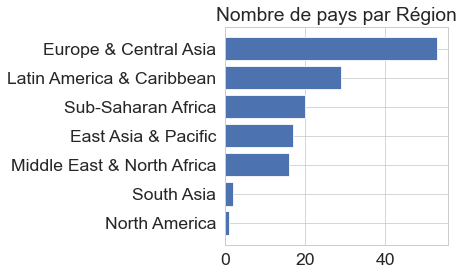

In [180]:
plt.figure(figsize=(4,4))
#sns.barplot(x= country.groupby('Region')[['Short Name']].count()['Short Name'].sort_values(), y = country.groupby('Region')[['Short Name']].count().reset_index().sort_values(by='Short Name')['Region'])
plt.barh(y = countries.groupby('Region')[['Short Name']].count().reset_index().sort_values(by='Short Name')['Region'], width = countries.groupby('Region')[['Short Name']].count()['Short Name'].sort_values())
plt.title('Nombre de pays par Région')
plt.show()

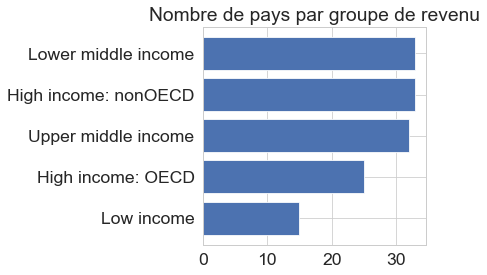

In [182]:
plt.figure(figsize=(4,4))
plt.barh(y = countries.groupby('Income Group')[['Short Name']].count().reset_index().sort_values(by='Short Name')['Income Group'], width = countries.groupby('Income Group')[['Short Name']].count()['Short Name'].sort_values())
plt.title('Nombre de pays par groupe de revenu')
plt.show()

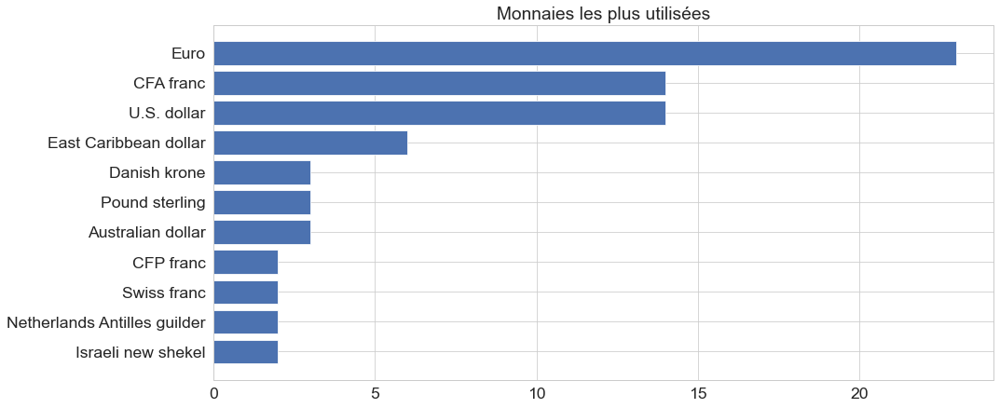

In [183]:
plt.figure(figsize=(15,7))
plt.barh(y = countries.groupby('Currency Unit')[['Short Name']].count().reset_index().sort_values(by='Short Name')['Currency Unit'].tail(11), width = countries.groupby('Currency Unit')[['Short Name']].count()['Short Name'].sort_values().tail(11))
plt.title('Monnaies les plus utilisées')
plt.show()

EdStatsCountry.csv possède des informations gloables sur l'économie de chaque pays du monde mais aussi un regroupement par région et niveau de revenu. 

### Dataset EdStatsCountry-Series.csv

In [200]:
countryseries = pd.read_csv(r'C:\Users\dtulomba\Documents\ProjetsCours\final project\Projet+Python_Dataset_Edstats_csv\EdStatsCountry-Series.csv', delimiter=";")

In [201]:
countryseries.head(3)

,CountryCode,Unnamed: 1,Unnamed: 2
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...


In [202]:
countryseries['CountryCode'].nunique()

211

In [204]:
countries[~countries['Country Code'].isin(countryseries['CountryCode'].unique())][['Short Name']]

,Short Name
5,Arab World
47,Curaçao
57,East Asia & Pacific (developing only)
58,East Asia & Pacific (all income levels)
59,Europe & Central Asia (developing only)
60,Europe & Central Asia (all income levels)
63,Euro area
68,European Union
89,High income
92,Heavily indebted poor countries (HIPC)


Nous ne retrouvons pas le même nombre de pays dans countryseries que dans countries. Certains pays diffèrent, comme par exemple : Curaçao, St Martin, Nauru, South Sudan, Sint Marteen (Dutch Part). 


### Dataset EdStatsSeries.csv

In [261]:
series = pd.read_csv(r'C:\Users\dtulomba\Documents\ProjetsCours\final project\Projet+Python_Dataset_Edstats_csv\EdStatsSeries.csv')

In [262]:
series.head(3)

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Ci-dessous nous pouvons constater que ce dataset contient les données descriptives sur les indicateurs socio économique disponibles dans la dataframe data

In [263]:
series.shape

(3665, 21)

In [264]:
#Nous vérifions ici s'ils ont tous le même nombre d'indicateurs dans les 2 dataframe series et data

series['Series Code'].nunique() == data['Indicator Code'].nunique()

True

### Ci-dessous nous avons testé si les deux dataframes que nous avons téléchargé contiennent la même liste des pays et des zones géographiques 

In [205]:
data[~data['Country Code'].isin(countryseries['CountryCode'].unique())]['Country Name'].unique().tolist()

['Arab World',
 'East Asia & Pacific',
 'East Asia & Pacific (excluding high income)',
 'Euro area',
 'Europe & Central Asia',
 'Europe & Central Asia (excluding high income)',
 'European Union',
 'Heavily indebted poor countries (HIPC)',
 'High income',
 'Latin America & Caribbean',
 'Latin America & Caribbean (excluding high income)',
 'Least developed countries: UN classification',
 'Low & middle income',
 'Low income',
 'Lower middle income',
 'Middle East & North Africa',
 'Middle East & North Africa (excluding high income)',
 'Middle income',
 'North America',
 'OECD members',
 'South Asia',
 'Sub-Saharan Africa',
 'Sub-Saharan Africa (excluding high income)',
 'Upper middle income',
 'World',
 'British Virgin Islands',
 'Curacao',
 'Nauru',
 'Sint Maarten (Dutch part)',
 'South Sudan',
 'St. Martin (French part)']

### Le nombre d'indicateurs par pays

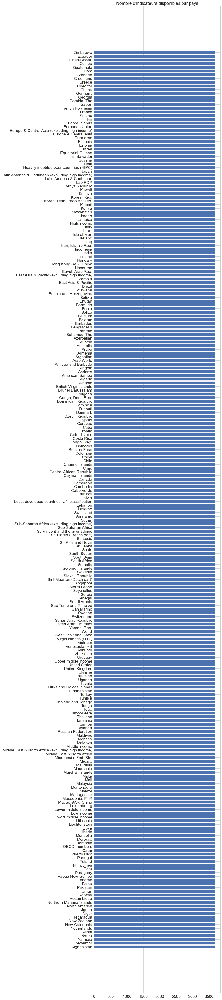

In [210]:
plt.figure(figsize=(10,80))
plt.barh(y = data.groupby('Country Name')[['Indicator Code']].count().reset_index().sort_values(by='Indicator Code')['Country Name'], 
         width =  data.groupby('Country Name')[['Indicator Code']].count().reset_index().sort_values(by='Indicator Code')['Indicator Code'])
plt.title('Nombre d\'indicateurs disponibles par pays')
plt.show()

In [211]:
print(data.groupby('Country Name')[['Indicator Code']].count().reset_index().sort_values(by='Indicator Code')['Indicator Code'].min())
print( data.groupby('Country Name')[['Indicator Code']].count().reset_index().sort_values(by='Indicator Code')['Indicator Code'].max())

3665
3665


Quels sont les mots qui reviennent le plus souvent dans les noms des indicateurs?

In [212]:
import collections
liste_mots_indicateurs = [i.split(' ', 1)[0] for i in data['Indicator Name'].tolist()]
mots_indicateurs_populaires = collections.Counter(liste_mots_indicateurs).most_common(30)

In [213]:
mots_indicateurs_populaires
mots_indicateurs_populaires.reverse()

In [214]:
df_mots_indicateurs_populaires = pd.DataFrame(mots_indicateurs_populaires, columns = ['Mot', 'Nombre d\'occurences']).sort_values(by='Nombre d\'occurences', ascending=False)

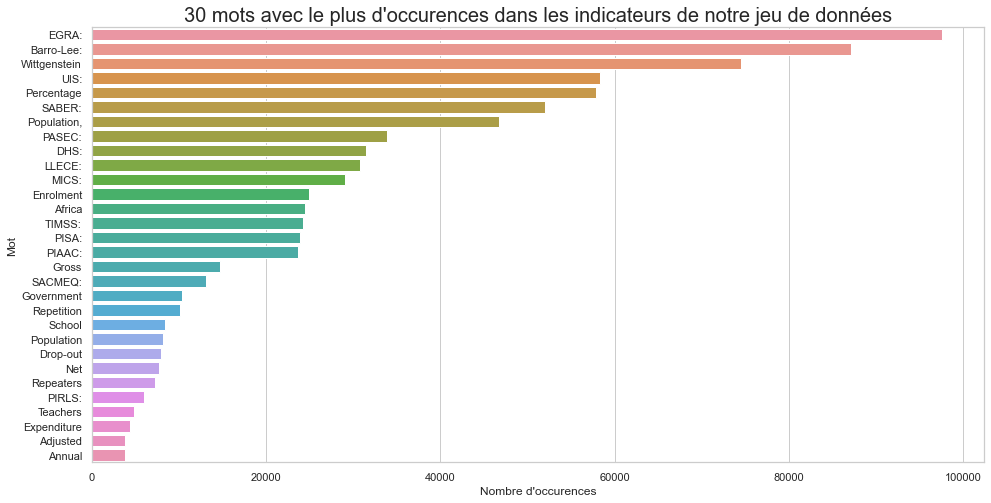

In [215]:
sns.set(style="whitegrid")
plt.figure(figsize=(16, 8))
sns.barplot(y = 'Mot', x='Nombre d\'occurences', data = df_mots_indicateurs_populaires)
plt.title('30 mots avec le plus d\'occurences dans les indicateurs de notre jeu de données', size=20)
#sns.barplot(x=[elem1 for elem1, elem2 in mots_indicateurs_populaires], y=[elem2 for elem1, elem2 in mots_indicateurs_populaires], hue = 'mots')
plt.show()

La recherche des mots les plus populaires dans les noms des indicateurs montre que le jeu de données contient des données relatives à l'éducation. Pour les mots avec le plus d'occurence, par exemple :

EdStatsData.csv montre l'évolution de plusieurs indicateurs pour tous les pays et zones géographiques du monde


### Le dataset EdStatsFootNote.csv

In [224]:
footnote = pd.read_csv(r'C:\Users\dtulomba\Documents\ProjetsCours\final project\Projet+Python_Dataset_Edstats_csv\EdStatsFootNote.csv')
footnote

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN
...,...,...,...,...,...
643633,ZWE,SH.DYN.MORT,YR2007,Uncertainty bound is 91.6 - 109.3,NaN
643634,ZWE,SH.DYN.MORT,YR2014,Uncertainty bound is 54.3 - 76,NaN
643635,ZWE,SH.DYN.MORT,YR2015,Uncertainty bound is 48.3 - 73.3,NaN
643636,ZWE,SH.DYN.MORT,YR2017,5-year average value between 0s and 5s,NaN


In [225]:
footnote.head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


In [226]:
footnote['DESCRIPTION'].unique().tolist()

['Country estimation.',
 'UIS Estimation',
 'UNESCO Institute for Statistics (UIS) estimate',
 '5-year average value between 0s and 5s',
 'Percentage includes lower secondary education.',
 'Country data',
 'Country Data',
 'UNSD WPP08 revision file 2A and 3A.',
 'Not applicable',
 'Percentage includes all tertiary levels (ISCED 5-8)',
 'Estimated',
 'UIS estimation.',
 '<0.1. Plausible bound is <0.1-0.1',
 'Uncertainty bound is 127.1 - 148.2',
 'Uncertainty bound is 146.6 - 173.2',
 'Uncertainty bound is 134.1 - 157.1',
 'Uncertainty bound is 207.2 - 261.6',
 'Uncertainty bound is 60.2 - 86.1',
 'Uncertainty bound is 184.5 - 227.9',
 'Uncertainty bound is 167.8 - 201.7',
 'Uncertainty bound is 130.4 - 152.5',
 'Uncertainty bound is 240.3 - 308.5',
 'Country estimation',
 'Uncertainty bound is 212.6 - 269.3',
 'Uncertainty bound is 201.4 - 253.3',
 'Uncertainty bound is 190.1 - 236.6',
 'Uncertainty bound is 162.4 - 193.8',
 'Uncertainty bound is 123.7 - 144.2',
 'Uncertainty bound is 9

In [227]:
footnote['Year'] = footnote['Year'].apply(lambda x : x[2:])

In [228]:
footnote.drop(['Unnamed: 4'], axis=1, inplace=True)

In [229]:
footnote.head()

,CountryCode,SeriesCode,Year,DESCRIPTION
0,ABW,SE.PRE.ENRL.FE,2001,Country estimation.
1,ABW,SE.TER.TCHR.FE,2005,Country estimation.
2,ABW,SE.PRE.TCHR.FE,2000,Country estimation.
3,ABW,SE.SEC.ENRL.GC,2004,Country estimation.
4,ABW,SE.PRE.TCHR,2006,Country estimation.


In [230]:
footnote.shape

(643638, 4)

In [231]:
footnote['Year'].sort_values().unique()

array(['1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977',
       '1978', '1979', '1980', '1981', '1982', '1983', '1984', '1985',
       '1986', '1987', '1988', '1989', '1990', '1991', '1992', '1993',
       '1994', '1995', '1996', '1997', '1998', '1999', '2000', '2001',
       '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009',
       '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017',
       '2020', '2025', '2030', '2035', '2040', '2045', '2050'],
      dtype=object)

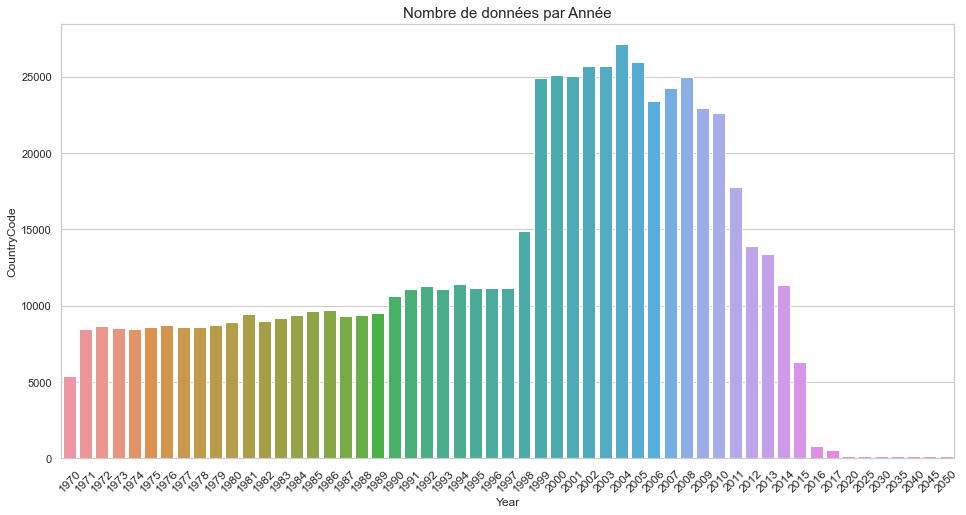

In [232]:
sns.set(style="whitegrid")
plt.figure(figsize=(16, 8))
plt.title('Nombre de données par Année', size=15)
plot = sns.barplot(y = 'CountryCode', x='Year', data = footnote.groupby('Year').count().reset_index())
plot.set_xticklabels(labels = footnote.groupby('Year').count().reset_index()['Year'], rotation=45, size=12)
#sns.barplot(x=[elem1 for elem1, elem2 in mots_indicateurs_populaires], y=[elem2 for elem1, elem2 in mots_indicateurs_populaires], hue = 'mots')
plt.show()

### Dans les prochaines sections nous allons sélectionner les données qui nous intéresse 

In [75]:
data.loc[data["Indicator Name"].str.contains("Internet")]["Indicator Name"].unique()

array(['Internet users (per 100 people)'], dtype=object)

In [76]:
data.loc[data["Indicator Name"].str.contains("enrolment")]["Indicator Name"].unique()

array(['Adjusted net enrolment rate, lower secondary, both sexes (%)',
       'Adjusted net enrolment rate, lower secondary, female (%)',
       'Adjusted net enrolment rate, lower secondary, gender parity index (GPI)',
       'Adjusted net enrolment rate, lower secondary, male (%)',
       'Adjusted net enrolment rate, primary, both sexes (%)',
       'Adjusted net enrolment rate, primary, female (%)',
       'Adjusted net enrolment rate, primary, gender parity index (GPI)',
       'Adjusted net enrolment rate, primary, male (%)',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'Adjusted net enrolment rate, upper secondary, female (%)',
       'Adjusted net enrolment rate, upper secondary, gender parity index (GPI)',
       'Adjusted net enrolment rate, upper secondary, male (%)',
       'Gross enrolment ratio, lower secondary, both sexes (%)',
       'Gross enrolment ratio, lower secondary, female (%)',
       'Gross enrolment ratio, lower secondary, gen

In [77]:
data.loc[data["Indicator Name"].str.contains("expenditure")]["Indicator Name"].unique()

array(['All staff compensation as % of total expenditure in lower secondary public institutions (%)',
       'All staff compensation as % of total expenditure in post-secondary non-tertiary public institutions (%)',
       'All staff compensation as % of total expenditure in pre-primary public institutions (%)',
       'All staff compensation as % of total expenditure in primary public institutions (%)',
       'All staff compensation as % of total expenditure in public institutions (%)',
       'All staff compensation as % of total expenditure in secondary public institutions (%)',
       'All staff compensation as % of total expenditure in tertiary public institutions (%)',
       'All staff compensation as % of total expenditure in upper secondary public institutions (%)',
       'Capital expenditure as % of total expenditure in lower secondary public institutions (%)',
       'Capital expenditure as % of total expenditure in post-secondary non-tertiary public institutions (%)',
   

### On va tenter de faire des groupes d'années pour réduire le nombre de NaN dans data

In [249]:
data.columns

Index(['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code',
       '1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69'],
      dtype='object')

In [288]:
data_copy = data.copy()
data_copy.head(3)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [289]:
data_copy['1970s'] = data_copy[[str(year) for year in range(1970,1980,1)]].mean(1)

data_copy['1980s'] = data_copy[[str(year) for year in range(1980,1990,1)]].mean(1)
data_copy['1990s'] = data_copy[[str(year) for year in range(1990,2000,1)]].mean(1)
data_copy['2000s'] = data_copy[[str(year) for year in range(2000,2010,1)]].mean(1)
data_copy['2010s'] = data_copy[[str(year) for year in [2010,2011,2012,2013,2014,2015,2016,2017]]].mean(1)
data_copy['2020s'] = data_copy[[str(year) for year in [2020,2025]]].mean(1)
data_copy['2030s'] = data_copy[[str(year) for year in [2030,2035]]].mean(1)
data_copy['2040s'] = data_copy[[str(year) for year in [2040,2045]]].mean(1)
data_copy['2050s'] = data_copy[[str(year) for year in [2050,2055]]].mean(1)
data_copy['2060s'] = data_copy[[str(year) for year in [2060,2065]]].mean(1)
data_copy['2070s'] = data_copy[[str(year) for year in [2070,2075]]].mean(1)
data_copy['2080s'] = data_copy[[str(year) for year in [2080,2085]]].mean(1)
data_copy['2090s'] = data_copy[[str(year) for year in [2090,2095]]].mean(1)
data_copy['2100s'] = data_copy[[str(2100)]].mean(1)

In [290]:
data_copy.drop(['1970', '1971', '1972', '1973', '1974', '1975', '1976', '1977', '1978',
       '1979', '1980', '1981', '1982', '1983', '1984', '1985', '1986', '1987',
       '1988', '1989', '1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004', '2005',
       '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014',
       '2015', '2016', '2017', '2020', '2025', '2030', '2035', '2040', '2045',
       '2050', '2055', '2060', '2065', '2070', '2075', '2080', '2085', '2090',
       '2095', '2100', 'Unnamed: 69'], axis=1, inplace=True)

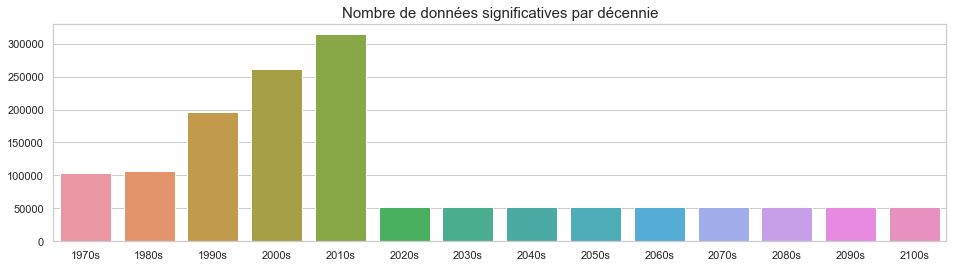

In [291]:
sns.set(style="whitegrid")
plt.figure(figsize=(16, 4))
plt.title('Nombre de données significatives par décennie', size=15)
plot = sns.barplot(y = data_copy.shape[0] - data_copy[['1970s', '1980s', '1990s', '2000s', '2010s', '2020s', '2030s', '2040s',
       '2050s', '2060s', '2070s', '2080s', '2090s', '2100s']].isna().sum().values, x = data_copy[['1970s', '1980s', '1990s', '2000s', '2010s', '2020s', '2030s', '2040s',
       '2050s', '2060s', '2070s', '2080s', '2090s', '2100s']].isna().sum().index)
plt.show()

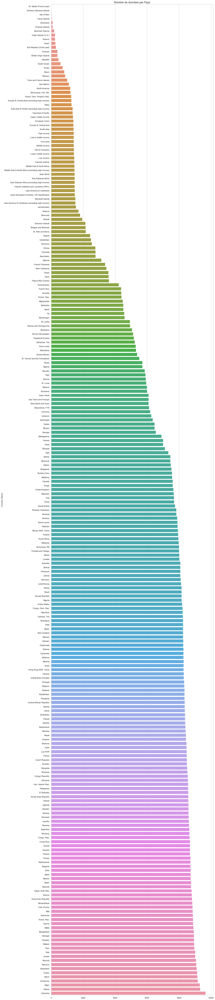

In [254]:
sns.set(style="whitegrid")
plt.figure(figsize=(16, 100))
plt.title('Nombre de données par Pays', size=15)
plot = sns.barplot(x = data_copy.groupby('Country Name')[['1970s', '1980s', '1990s', '2000s', '2010s', '2020s', '2030s', '2040s',
       '2050s', '2060s', '2070s', '2080s', '2090s', '2100s']].count().sum(axis=1).sort_values().values, 
                   y = data_copy.groupby('Country Name')[['1970s', '1980s', '1990s', '2000s', '2010s', '2020s', '2030s', '2040s',
       '2050s', '2060s', '2070s', '2080s', '2090s', '2100s']].count().sum(axis=1).sort_values().index)
plt.show()

##### Ci dessus, nous voyons les variables qui ont les plus de données pour la décénie de 2010 et en fonction de cela nous procéderons au choix de nos données

In [273]:
data_copy[['Indicator Name', '2010s']].groupby('Indicator Name').count().sort_values(by='2010s',ascending=False)

,2010s
Indicator Name,
"Population, total",240
Population growth (annual %),240
GDP per capita (current US$),229
GDP at market prices (current US$),229
Internet users (per 100 people),229
...,...
EGRA: Listening Comprehension - Share of students with a zero score (%). Songhoi. 2nd Grade,0
EGRA: Correct Letter Sounds Read Per Minute (Mean). English. 4th Grade,0
"SACMEQ: Mean performance on the reading scale, total",0


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



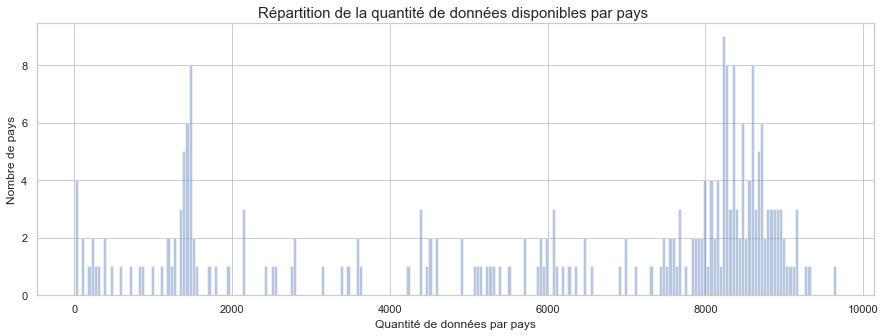

In [255]:
sns.set(style="whitegrid")
plt.figure(figsize=(15, 5))
plt.xlabel('Quantité de données par pays', size=12)
plt.ylabel('Nombre de pays', size=12)
plt.title('Répartition de la quantité de données disponibles par pays ', size=15)
plot = sns.distplot(data_copy.groupby('Country Name')[['1970s', '1980s', '1990s', '2000s', '2010s', '2020s', '2030s', '2040s',
       '2050s', '2060s', '2070s', '2080s', '2090s', '2100s']].count().sum(axis=1).sort_values().values, bins = 241, norm_hist = False, hist_kws=dict(cumulative=False),
             kde = False)
plt.show()


### Dans la section suivante, nous avons sélectionner quelques variables avec lesquels nous allons continuer le projet 

In [258]:
data.loc[data["Indicator Name"].str.contains("enrolment")]["Indicator Name"].unique()
liste_indicators = ["GDP at market prices (current US$)",
                    "GDP per capita (current US$)","GNI (current US$)",
                    "GNI per capita, Atlas method (current US$)",
                    "Mortality rate, under-5 (per 1,000)","Population growth (annual %)",
                    "Population, ages 15-64, total", # (traduit aussi en tant que population active)
                    "Population, total", "Gross enrolment ratio, tertiary, both sexes (%)", 
                    "Youth literacy rate, population 15-24 years, both sexes (%)",
                    "Adjusted net enrolment rate, upper secondary, both sexes (%)",
                    "Adult literacy rate, population 15+ years, both sexes (%)",
                    "Government expenditure on secondary education as % of GDP (%)",
                    "Government expenditure on tertiary education as % of GDP (%)", "Internet users (per 100 people)"]
selective_indicator = data.loc[data["Indicator Name"].isin(liste_indicators)]
selective_indicator.head(3)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
8,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20,Arab World,ARB,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1243,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,3.091053e+10,3.589492e+10,4.276150e+10,5.434601e+10,1.041715e+11,1.155599e+11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Ci-dessous nous avons chercher à mettre les années en ligne pour la suite de notre projet 

On regroupe les dataframes data et countries de façon à avoir les régions pour chaque pays et pouvoir faire des regroupements

In [268]:
selective_indicator=pd.melt(selective_indicator, id_vars=['Country Name', 'Country Code','Indicator Name', 'Indicator Code'], value_vars=['1970','1971','1972','1973','1974','1975','1976','1977','1978','1979','1980','1981','1982', '1983','1984','1985','1986','1987','1988','1989','1990','1991','1992','1993','1994','1995', '1996','1997','1998','1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2020','2025','2030','2035','2040','2045','2050','2055','2060','2065','2070','2075','2080','2085','2090','2095','2100'])
selective_indicator.head(4)

,Country Name,Country Code,Indicator Name,Indicator Code,variable,value
0,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,1970,NaN
1,Arab World,ARB,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,1970,NaN
2,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,1970,3.091053e+10
3,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,1970,2.504886e+02


### Dans cette partie nous avons indentifié une période sur laquelle nous allons travailler

Pour cela nous avons d'abord regarder notre dataframe en se rendant compte de la période où il le plus de données et aussi nous avons mis en place un graphique pour mieux le visualiser.

In [260]:
dataframe_me=selective_indicator2.groupby(['variable']).count().sort_values(by=['value'],ascending=False)
pd.set_option('display.max_rows', dataframe.shape[0]+1)
dataframe

,Country Name,Country Code,Indicator Name,Indicator Code,value
variable,,,,,
2011,3630,3630,3630,3630,2617
2010,3630,3630,3630,3630,2602
2009,3630,3630,3630,3630,2549
2012,3630,3630,3630,3630,2530
2008,3630,3630,3630,3630,2526
2013,3630,3630,3630,3630,2515
2007,3630,3630,3630,3630,2515
2006,3630,3630,3630,3630,2484
2004,3630,3630,3630,3630,2481


### On calcule ici le taux de complétude pour chaque année 

In [265]:
selective_indicator["Country Code"].nunique()*selective_indicator["Indicator Name"].nunique()
completitude_rate=dataframe["value"]/3146

### Nous voulons ici voulu choisir la période de notre étude  



### Disponibilité de données selon les années, Réprésentation graphique 

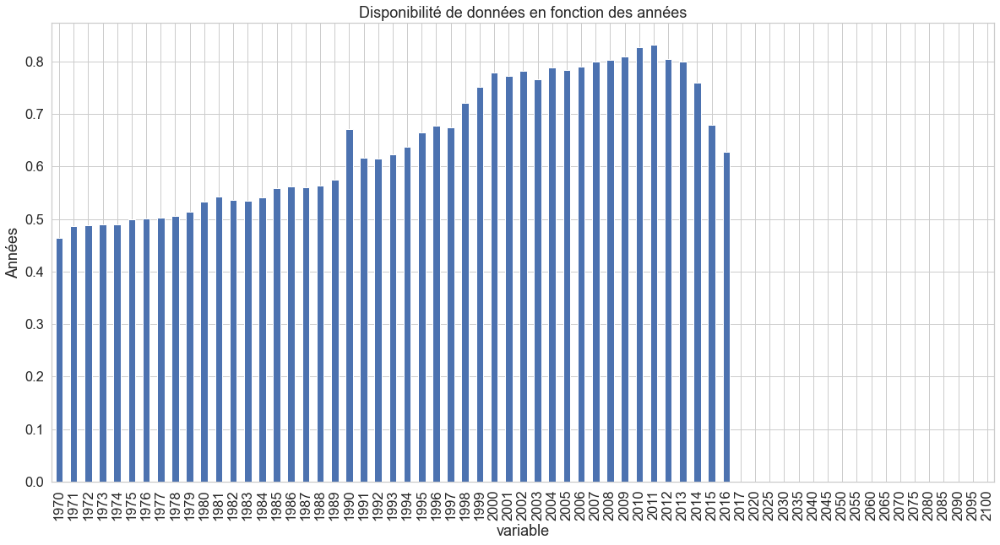

In [266]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
plt.ylabel(ylabel='Années')
plt.xlabel(xlabel='Quantité de données en %')
plt.title("Disponibilité de données en fonction des années")
final_data=completitude_rate.sort_index()
final_data.plot(kind="bar")
plt.show()

Nous avons repris ci dessous notre dataframe data que nous avions copié plus haut et nous avons essayé de voir la répartition de données pour la décennie 2010-2019

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



[]

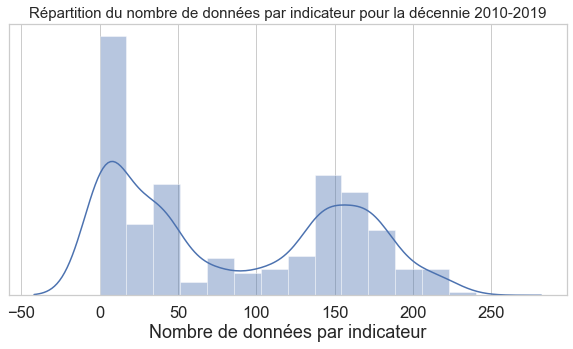

In [274]:
plt.figure(figsize=(10,5))
plt.title('Répartition du nombre de données par indicateur pour la décennie 2010-2019', size=15)
plt.xlabel('Nombre de données par indicateur')
ax = plt.gca()
ax.set_yticks([])
sns.distplot(data_copy[['Indicator Name', '2010s']].groupby('Indicator Name').count().sort_values(by='2010s',ascending=False))
plt.plot()

Nous pouvons avoir plusieurs constats après cette étude : 

- Il y a beaucoup d'indicateurs avec très peu de données, c'est à dire inférieure à 50% comme nous pouvons le voir dans le premier graphique.
- Au niveau de la distribution, il peut avoir plusieurs 2 distributions par exemple. On également penser qu'on a 2 distributions qui se somment : une correspondant aux pays, l'autre aux groupes de pays.



### On a retenu la liste des années qui ont un taux de complétude de plus de 60%

In [267]:
list_of_years=final_data[final_data > 0.6].index.tolist()
list_of_years

['1990',
 '1991',
 '1992',
 '1993',
 '1994',
 '1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2005',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016']

In [270]:
df_final=selective_indicator[selective_indicator["variable"].isin(list_of_years)]
df_final.head(4)

,Country Name,Country Code,Indicator Name,Indicator Code,variable,value
72600,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,1990,NaN
72601,Arab World,ARB,"Adult literacy rate, population 15+ years, bot...",SE.ADT.LITR.ZS,1990,5.459347e+01
72602,Arab World,ARB,GDP at market prices (current US$),NY.GDP.MKTP.CD,1990,4.438599e+11
72603,Arab World,ARB,GDP per capita (current US$),NY.GDP.PCAP.CD,1990,2.003988e+03


Nous allons également continuer avec les dataframes countries et data principalement et on va les  concaténer pour obténir une data frame exploitable : 

Le dataset comporte bien des données éducatives et tous les pays du monde semblent y être intégrés. 

Nous allons séléctionner également quelques indicateurs que nous éstimons importants et qui vont nous permettre de faire des comparaisons et ainsi tirer des conclusions. 

Nous allons travailler sur la période 1990 à 2016 car c'est dans cette période que nous avons le plus de données.


### Pour la suite de notre travail et pour une meilleure analyse de nos variables, nous allons mettre l'indicator Name en colonne

 

Avant de concaténer nos deux dataset que nous avons transformé en dataframe, nous allons procéder au pivot de notre précédente df_final pour une meilleure lecture. 

In [271]:
df_final_pivot = pd.pivot_table(df_final, values='value', index=['Country Name', 'Country Code', "variable"], columns=['Indicator Name']).reset_index()
df_final_pivot 

Indicator Name,Country Name,Country Code,variable,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)"
0,Afghanistan,AFG,1990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.27317,0.000000,177.3,3.925342,6093533.0,12249114.0,NaN
1,Afghanistan,AFG,1991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,171.1,5.900771,6465611.0,12993657.0,NaN
2,Afghanistan,AFG,1992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,165.2,7.325447,6960330.0,13981231.0,NaN
3,Afghanistan,AFG,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,159.6,7.665433,7513651.0,15095099.0,NaN
4,Afghanistan,AFG,1994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,154.5,6.895569,8050644.0,16172719.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6447,Zimbabwe,ZWE,2012,NaN,NaN,1.424249e+10,968.163871,1.202891e+10,810.0,NaN,NaN,5.86867,12.000000,76.0,2.228306,8171080.0,14710826.0,NaN
6448,Zimbabwe,ZWE,2013,32.071152,NaN,1.545177e+10,1026.388289,1.357417e+10,890.0,NaN,NaN,5.87175,15.500000,70.0,2.309366,8369351.0,15054506.0,NaN
6449,Zimbabwe,ZWE,2014,NaN,88.69342,1.589105e+10,1031.104616,1.403881e+10,900.0,NaN,NaN,NaN,16.364740,64.3,2.344799,8575500.0,15411675.0,90.42812
6450,Zimbabwe,ZWE,2015,NaN,NaN,1.630467e+10,1033.415842,1.432232e+10,890.0,NaN,NaN,8.43327,22.742818,59.9,2.345643,8788963.0,15777451.0,NaN


In [86]:
df_final_pivot.loc[:,"Adult literacy rate, population 15+ years, both sexes (%)"].isna()

0        True
1        True
2        True
3        True
4        True
        ...  
6447     True
6448     True
6449    False
6450     True
6451     True
Name: Adult literacy rate, population 15+ years, both sexes (%), Length: 6452, dtype: bool

### Nous avons mergé nos deux dataset afin de récuper les variables : "Region", "Income Group" à partir de  "Country Code"

Les pays n'ont pas été catégoriser par région et groupe économique dans ce dataset pour la suite de notre travail, nous intégrerons le dataset EdStatsCountry qui lui contient le groupe économique et la région de chaque pays, ceci sera nécessaire à notre travail surtout dans le cas de traitement de valeurs manquantes. Nous avons choisi de procéder de cette manière car en fonction du groupe économique et de la région du monde, nous n'aurons pas les mêmes situations et nous ne pouvons compléter les valeurs manquantes sans prendre en compte les situations de chaque pays 


In [278]:
df_final_pivot=df_final_pivot.merge(countries[["Country Code","Region","Income Group"]], on="Country Code", how="inner")
df_final_pivot

,Country Name,Country Code,variable,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
0,Afghanistan,AFG,1990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.27317,0.000000,177.3,3.925342,6093533.0,12249114.0,NaN,NaN,NaN
1,Afghanistan,AFG,1991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,171.1,5.900771,6465611.0,12993657.0,NaN,NaN,NaN
2,Afghanistan,AFG,1992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,165.2,7.325447,6960330.0,13981231.0,NaN,NaN,NaN
3,Afghanistan,AFG,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,159.6,7.665433,7513651.0,15095099.0,NaN,NaN,NaN
4,Afghanistan,AFG,1994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,154.5,6.895569,8050644.0,16172719.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6443,Zimbabwe,ZWE,2012,NaN,NaN,1.424249e+10,968.163871,1.202891e+10,810.0,NaN,NaN,5.86867,12.000000,76.0,2.228306,8171080.0,14710826.0,NaN,NaN,NaN
6444,Zimbabwe,ZWE,2013,32.071152,NaN,1.545177e+10,1026.388289,1.357417e+10,890.0,NaN,NaN,5.87175,15.500000,70.0,2.309366,8369351.0,15054506.0,NaN,NaN,NaN
6445,Zimbabwe,ZWE,2014,NaN,88.69342,1.589105e+10,1031.104616,1.403881e+10,900.0,NaN,NaN,NaN,16.364740,64.3,2.344799,8575500.0,15411675.0,90.42812,NaN,NaN
6446,Zimbabwe,ZWE,2015,NaN,NaN,1.630467e+10,1033.415842,1.432232e+10,890.0,NaN,NaN,8.43327,22.742818,59.9,2.345643,8788963.0,15777451.0,NaN,NaN,NaN


### Pré traitement de données

In [279]:
df_final_pivot.isnull().sum().sort_values(ascending=False)

Adjusted net enrolment rate, upper secondary, both sexes (%)     5675
Youth literacy rate, population 15-24 years, both sexes (%)      5345
Adult literacy rate, population 15+ years, both sexes (%)        5334
Government expenditure on secondary education as % of GDP (%)    5108
Government expenditure on tertiary education as % of GDP (%)     5040
Region                                                           2750
Income Group                                                     2750
Gross enrolment ratio, tertiary, both sexes (%)                  2726
Internet users (per 100 people)                                  1122
GNI per capita, Atlas method (current US$)                        910
GNI (current US$)                                                 785
Mortality rate, under-5 (per 1,000)                               601
Population, ages 15-64, total                                     566
GDP per capita (current US$)                                      505
GDP at market prices

Nous constatons ici qu'il y a une diversité dans nos données et que plusieurs de nos variables ont beaucoup de données manquantes. 

In [280]:
df_final_pivot.head(2)

,Country Name,Country Code,variable,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
0,Afghanistan,AFG,1990,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.27317,0.0,177.3,3.925342,6093533.0,12249114.0,NaN,NaN,NaN
1,Afghanistan,AFG,1991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,171.1,5.900771,6465611.0,12993657.0,NaN,NaN,NaN


#### Ci dessous nous avons testé si il y avait des valeurs dupliquées dans notre dataframe 

In [281]:
df_final_pivot.duplicated(keep=False).sum()

0

#### Ci dessous on veut tester s'il y a des valeurs manquantes dans notre dataframe

In [282]:
df_final_pivot.isna().sum().sort_values(ascending=False)

Adjusted net enrolment rate, upper secondary, both sexes (%)     5675
Youth literacy rate, population 15-24 years, both sexes (%)      5345
Adult literacy rate, population 15+ years, both sexes (%)        5334
Government expenditure on secondary education as % of GDP (%)    5108
Government expenditure on tertiary education as % of GDP (%)     5040
Region                                                           2750
Income Group                                                     2750
Gross enrolment ratio, tertiary, both sexes (%)                  2726
Internet users (per 100 people)                                  1122
GNI per capita, Atlas method (current US$)                        910
GNI (current US$)                                                 785
Mortality rate, under-5 (per 1,000)                               601
Population, ages 15-64, total                                     566
GDP per capita (current US$)                                      505
GDP at market prices

In [283]:
df_final_pivot_na=df_final_pivot[df_final_pivot["Region"].isna()==False]
# df_final_pivot_na

In [91]:
#final_data.loc[("East Asia & Pacific","High income: OECD")]

#### Pour rémedier à ce problème, nous avons alors fait un groupby par région et calculer la moyenne en fonction de la région et du groupe économique correspondant à chaque pays. 

In [293]:
only_with_region  = df_final_pivot[(df_final_pivot["Region"].isna()==False) & (df_final_pivot["Income Group"].isna()==False)]
final_data=only_with_region.groupby(by=['Region','Income Group']).mean()
final_data

Adjusted net enrolment rate, upper secondary, both sexes (%)  \
Region                     Income Group                                                                         
East Asia & Pacific        High income: OECD                                             91.108917              
                           High income: nonOECD                                          78.157612              
                           Low income                                                    20.250015              
                           Lower middle income                                           33.912508              
                           Upper middle income                                           40.220821              
Europe & Central Asia      High income: OECD                                             81.043214              
                           High income: nonOECD                                          82.237899              
                           Low income                                                    52.934098              
                           Lower middle income                                           70.923152              
                           Upper middle income                                           82.310336              
Latin America & Caribbean  High income: OECD                                             82.575329              
                           High income: nonOECD                                          67.908767              
                           Lower middle income                                           41.042526              
                           Upper middle income                                           48.796756              
Middle East & North Africa High income: OECD                                             92.084686              
                           High income: nonOECD                                          70.892890              
                           Lower middle income                                           35.677471              
                           Upper middle income                                           55.528893              
North America              High income: nonOECD                                          68.157654              
South Asia                 Lower middle income                                           24.366563              
Sub-Saharan Africa         Low income                                                     5.724032              
                           Lower middle income                                           16.238061              
                           Upper middle income                                           55.642339              

                                                 Adult literacy rate, population 15+ years, both sexes (%)  \
Region                     Income Group                                                                      
East Asia & Pacific        High income: OECD                                                   NaN           
                           High income: nonOECD                                          94.413586           
                           Low income                                                    78.485948           
                           Lower middle income                                           79.535683           
                           Upper middle income                                                 NaN           
Europe & Central Asia      High income: OECD                                             96.871760           
                           High income: nonOECD                                          98.646517           
                           Low income                                                    99.450680           
                           Lower middle income                                           99.294774           
             

#### Nous avons par la suite, remplacés toute les valeurs manquantes par la moyenne que nous avons calculer plus haut. 

In [294]:
def impute_row(row):
    region  = row["Region"]
    incom_group = row ["Income Group"]
    na_cols = row[row.isna()==True].index
    row[na_cols]= final_data.loc[(region,incom_group)][na_cols]
    return row
#only_with_region  = df_final_pivot[(df_final_pivot["Region"].isna()==False) & (df_final_pivot["Income Group"].isna()==False)]

In [295]:
final_data=only_with_region.apply(func=impute_row,axis=1)
final_data

,Country Name,Country Code,variable,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
27,Albania,ALB,1990,82.310336,96.086802,2.101625e+09,639.463899,2.099725e+09,680.0,1.787637,0.689884,8.369110,0.000000,40.0,1.799086,2031132.0,3286542.0,98.904951,Europe & Central Asia,Upper middle income
28,Albania,ALB,1991,82.310336,96.086802,1.139167e+09,348.711318,1.117467e+09,420.0,1.787637,0.689884,8.859930,24.060761,38.3,-0.602810,2010074.0,3266790.0,98.904951,Europe & Central Asia,Upper middle income
29,Albania,ALB,1992,82.310336,96.086802,7.094526e+08,218.492166,6.806651e+08,300.0,1.787637,0.689884,9.294170,24.060761,36.9,-0.606435,1990676.0,3247039.0,98.904951,Europe & Central Asia,Upper middle income
30,Albania,ALB,1993,82.310336,96.086802,1.228071e+09,380.527371,1.216071e+09,320.0,1.787637,0.689884,11.188740,24.060761,35.5,-0.610166,1973388.0,3227287.0,98.904951,Europe & Central Asia,Upper middle income
31,Albania,ALB,1994,82.310336,96.086802,1.985674e+09,619.065163,1.990674e+09,400.0,1.787637,0.689884,10.647750,24.060761,34.2,-0.613881,1957314.0,3207536.0,98.904951,Europe & Central Asia,Upper middle income
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6416,Zambia,ZMB,2012,16.238061,55.445135,2.550337e+10,1734.930612,2.516991e+10,1670.0,1.610381,0.833399,3.981410,13.468200,76.1,3.005133,7522657.0,14699937.0,64.680696,Sub-Saharan Africa,Lower middle income
6417,Zambia,ZMB,2013,16.238061,55.445135,2.804546e+10,1850.793359,2.689320e+10,1730.0,1.610381,0.833399,7.154313,15.400000,72.9,3.036918,7798003.0,15153210.0,64.680696,Sub-Saharan Africa,Lower middle income
6418,Zambia,ZMB,2014,16.238061,55.445135,2.715063e+10,1738.088202,2.663370e+10,1770.0,1.610381,0.833399,7.154313,19.000000,69.6,3.040211,8088061.0,15620974.0,64.680696,Sub-Saharan Africa,Lower middle income
6419,Zambia,ZMB,2015,16.238061,55.445135,2.115439e+10,1313.889646,2.080748e+10,1560.0,1.610381,0.833399,7.154313,21.000000,66.1,3.024123,8391596.0,16100587.0,64.680696,Sub-Saharan Africa,Lower middle income


### Vérification des valeurs abbérantes pour chaque pays 

In [296]:
pd.set_option('display.max_rows', final_data['Country Name'].shape[0]+1)
final_data

,Country Name,Country Code,variable,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
27,Albania,ALB,1990,82.310336,96.086802,2.101625e+09,639.463899,2.099725e+09,680.000000,1.787637,0.689884,8.369110,0.000000,40.000000,1.799086,2.031132e+06,3286542.0,98.904951,Europe & Central Asia,Upper middle income
28,Albania,ALB,1991,82.310336,96.086802,1.139167e+09,348.711318,1.117467e+09,420.000000,1.787637,0.689884,8.859930,24.060761,38.300000,-0.602810,2.010074e+06,3266790.0,98.904951,Europe & Central Asia,Upper middle income
29,Albania,ALB,1992,82.310336,96.086802,7.094526e+08,218.492166,6.806651e+08,300.000000,1.787637,0.689884,9.294170,24.060761,36.900000,-0.606435,1.990676e+06,3247039.0,98.904951,Europe & Central Asia,Upper middle income
30,Albania,ALB,1993,82.310336,96.086802,1.228071e+09,380.527371,1.216071e+09,320.000000,1.787637,0.689884,11.188740,24.060761,35.500000,-0.610166,1.973388e+06,3227287.0,98.904951,Europe & Central Asia,Upper middle income
31,Albania,ALB,1994,82.310336,96.086802,1.985674e+09,619.065163,1.990674e+09,400.000000,1.787637,0.689884,10.647750,24.060761,34.200000,-0.613881,1.957314e+06,3207536.0,98.904951,Europe & Central Asia,Upper middle income
32,Albania,ALB,1995,82.310336,96.086802,2.424499e+09,760.559376,2.468099e+09,660.000000,1.787637,0.689884,10.220340,0.011169,32.900000,-0.617704,1.941355e+06,3187784.0,98.904951,Europe & Central Asia,Upper middle income
33,Albania,ALB,1996,82.310336,96.086802,3.314898e+09,1046.358511,3.385901e+09,920.000000,1.787637,0.689884,10.963050,0.032197,31.500000,-0.621511,1.941681e+06,3168033.0,98.904951,Europe & Central Asia,Upper middle income
34,Albania,ALB,1997,82.310336,96.086802,2.359903e+09,749.584649,2.409653e+09,830.000000,1.787637,0.689884,12.733760,0.048594,30.100000,-0.625430,1.940477e+06,3148281.0,98.904951,Europe & Central Asia,Upper middle income
35,Albania,ALB,1998,82.310336,96.086802,2.707124e+09,865.302162,2.783857e+09,900.000000,1.787637,0.689884,13.594760,0.065027,28.700000,-0.629334,1.938219e+06,3128530.0,98.904951,Europe & Central Asia,Upper middle income
36,Albania,ALB,1999,82.310336,96.086802,3.414761e+09,1098.425463,3.490536e+09,1010.000000,1.787637,0.689884,14.805040,0.081437,27.400000,-0.633352,1.936229e+06,3108778.0,98.904951,Europe & Central Asia,Upper middle income


Nous avons constaté qu'en affichant notre dataframe ci-dessus, nous avons des valeurs pour le country name qui ne correspondent pas aux noms de pays qui existent. Pour enlever ce problème nous avons procéder à la suppréssion de ses pays qui n'existent pas. 

In [297]:
indexNames_FirstCountry=final_data[final_data["Country Name"]=="West Bank and Gaza"].index
indexNames_SecondCountry=final_data[final_data["Country Name"]=="Virgin Islands (U.S.)"].index
indexNames_ThirdCountry=final_data[final_data["Country Name"]=="Solomon Islands"].index
#indexNames_FourthCountry=final_data[final_data["Country Name"]=="San Marino"].index
indexNames_FirstCountry
indexNames_SecondCountry
indexNames_ThirdCountry
#indexNames_FourthCountry

Int64Index([5158, 5159, 5160, 5161, 5162, 5163, 5164, 5165, 5166, 5167, 5168,
            5169, 5170, 5171, 5172, 5173, 5174, 5175, 5176, 5177, 5178, 5179,
            5180, 5181, 5182, 5183, 5184],
           dtype='int64')

### Nous avons supprimer ses pays en utilisant le code ci-dessous

In [298]:
final_data.drop(indexNames_FirstCountry, inplace=True)
final_data.drop(indexNames_SecondCountry, inplace=True)
final_data.drop(indexNames_ThirdCountry, inplace=True)
#final_data.drop(indexNames_FourthCountry, inplace=True)

In [299]:
 #final_data

Nous continuons donc avec la dataframe final_data qui n'a pas plus des données manquantes et qui n'a plus des valeurs abbérantes au niveau des pays. 

## STATISTIQUES DESCRIPTIVES 

In [300]:
final_data.describe().round(1)

,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)"
count,3617.0,3482.0,3.617000e+03,3617.0,3.617000e+03,3617.0,3536.0,3563.0,3563.0,3617.0,3590.0,3617.0,3536.0,3617.0,3482.0
mean,57.8,86.1,1.538765e+11,13800.6,1.581938e+11,13009.3,1.7,0.9,31.6,24.0,39.8,1.3,10602148.9,14438606.4,91.6
std,26.4,17.8,4.317881e+11,20737.8,4.328447e+11,18575.4,0.5,0.4,21.2,26.1,47.7,1.5,17454564.7,26158187.3,14.8
min,0.2,12.8,8.824448e+06,112.8,2.496033e+07,120.0,0.0,0.0,0.0,0.0,2.1,-11.0,40759.0,9003.0,19.4
25%,40.2,80.5,4.449375e+09,1209.2,5.110584e+09,1250.0,1.4,0.7,15.7,1.8,8.4,0.4,1354756.5,748134.0,93.1
50%,67.9,94.4,1.298324e+10,4591.9,1.425684e+10,4290.0,1.7,0.8,30.9,14.5,18.1,1.2,4276002.0,5386406.0,98.9
75%,81.0,96.9,7.606061e+10,18373.6,9.668589e+10,18615.3,2.1,1.2,46.8,40.2,49.4,2.2,11520524.2,14694835.0,99.6
max,98.4,100.0,3.890607e+12,192989.2,3.967431e+12,186080.0,5.1,3.0,119.8,98.3,253.9,16.3,144560447.0,207652865.0,100.0


In [301]:
final_data=final_data.fillna(0)
final_data.describe().round(1)

,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)"
count,3617.0,3617.0,3.617000e+03,3617.0,3.617000e+03,3617.0,3617.0,3617.0,3617.0,3617.0,3617.0,3617.0,3617.0,3617.0,3617.0
mean,57.8,82.9,1.538765e+11,13800.6,1.581938e+11,13009.3,1.6,0.9,31.1,24.0,39.5,1.3,10364721.7,14438606.4,88.2
std,26.4,23.9,4.317881e+11,20737.8,4.328447e+11,18575.4,0.6,0.4,21.4,26.1,47.7,1.5,17329132.0,26158187.3,22.6
min,0.2,0.0,8.824448e+06,112.8,2.496033e+07,120.0,0.0,0.0,0.0,0.0,0.0,-11.0,0.0,9003.0,0.0
25%,40.2,80.0,4.449375e+09,1209.2,5.110584e+09,1250.0,1.3,0.7,15.2,1.8,8.2,0.4,937634.0,748134.0,90.7
50%,67.9,94.4,1.298324e+10,4591.9,1.425684e+10,4290.0,1.7,0.8,30.2,14.5,17.9,1.2,4066581.0,5386406.0,98.9
75%,81.0,96.9,7.606061e+10,18373.6,9.668589e+10,18615.3,2.1,1.2,46.2,40.2,49.0,2.2,11139006.0,14694835.0,99.6
max,98.4,100.0,3.890607e+12,192989.2,3.967431e+12,186080.0,5.1,3.0,119.8,98.3,253.9,16.3,144560447.0,207652865.0,100.0


In [302]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3617 entries, 27 to 6420
Data columns (total 20 columns):
 #   Column                                                         Non-Null Count  Dtype  
---  ------                                                         --------------  -----  
 0   Country Name                                                   3617 non-null   object 
 1   Country Code                                                   3617 non-null   object 
 2   variable                                                       3617 non-null   object 
 3   Adjusted net enrolment rate, upper secondary, both sexes (%)   3617 non-null   float64
 4   Adult literacy rate, population 15+ years, both sexes (%)      3617 non-null   float64
 5   GDP at market prices (current US$)                             3617 non-null   float64
 6   GDP per capita (current US$)                                   3617 non-null   float64
 7   GNI (current US$)                                          

### Matrice de corrélation

In [303]:
final_data.corr()

,"Adjusted net enrolment rate, upper secondary, both sexes (%)","Adult literacy rate, population 15+ years, both sexes (%)",GDP at market prices (current US$),GDP per capita (current US$),GNI (current US$),"GNI per capita, Atlas method (current US$)",Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),"Gross enrolment ratio, tertiary, both sexes (%)",Internet users (per 100 people),"Mortality rate, under-5 (per 1,000)",Population growth (annual %),"Population, ages 15-64, total","Population, total","Youth literacy rate, population 15-24 years, both sexes (%)"
"Adjusted net enrolment rate, upper secondary, both sexes (%)",1.000000,0.585241,0.237469,0.478088,0.246308,0.502110,0.426114,0.341018,0.692514,0.483395,-0.786622,-0.425404,0.096924,-0.001662,0.476927
"Adult literacy rate, population 15+ years, both sexes (%)",0.585241,1.000000,0.117564,0.204234,0.123739,0.186284,0.434915,0.384623,0.437133,0.221059,-0.551714,-0.276751,0.101850,0.038831,0.983919
GDP at market prices (current US$),0.237469,0.117564,1.000000,0.223927,0.995656,0.261564,0.227324,0.181695,0.360593,0.291187,-0.213580,-0.149630,0.617921,0.626351,0.092885
GDP per capita (current US$),0.478088,0.204234,0.223927,1.000000,0.230342,0.929099,0.136158,0.220954,0.418069,0.627082,-0.413331,-0.081985,0.058888,-0.089964,0.139303
GNI (current US$),0.246308,0.123739,0.995656,0.230342,1.000000,0.273954,0.229108,0.183061,0.362889,0.293759,-0.219109,-0.155753,0.612779,0.615514,0.097975
"GNI per capita, Atlas method (current US$)",0.502110,0.186284,0.261564,0.929099,0.273954,1.000000,0.168515,0.239212,0.444106,0.618711,-0.434579,-0.113763,0.059823,-0.075509,0.116989
Government expenditure on secondary education as % of GDP (%),0.426114,0.434915,0.227324,0.136158,0.229108,0.168515,1.000000,0.598539,0.430669,0.194435,-0.353854,-0.188871,0.082499,0.087370,0.437857
Government expenditure on tertiary education as % of GDP (%),0.341018,0.384623,0.181695,0.220954,0.183061,0.239212,0.598539,1.000000,0.425359,0.253689,-0.283391,-0.126460,0.008765,0.025364,0.377358
"Gross enrolment ratio, tertiary, both sexes (%)",0.692514,0.437133,0.360593,0.418069,0.362889,0.444106,0.430669,0.425359,1.000000,0.581499,-0.620322,-0.406716,0.234031,0.155338,0.357165
Internet users (per 100 people),0.483395,0.221059,0.291187,0.627082,0.293759,0.618711,0.194435,0.253689,0.581499,1.000000,-0.478542,-0.199853,0.069101,-0.013885,0.156809


In [305]:
final_data.columns

Index(['Country Name', 'Country Code', 'variable',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'Adult literacy rate, population 15+ years, both sexes (%)',
       'GDP at market prices (current US$)', 'GDP per capita (current US$)',
       'GNI (current US$)', 'GNI per capita, Atlas method (current US$)',
       'Government expenditure on secondary education as % of GDP (%)',
       'Government expenditure on tertiary education as % of GDP (%)',
       'Gross enrolment ratio, tertiary, both sexes (%)',
       'Internet users (per 100 people)',
       'Mortality rate, under-5 (per 1,000)', 'Population growth (annual %)',
       'Population, ages 15-64, total', 'Population, total',
       'Youth literacy rate, population 15-24 years, both sexes (%)', 'Region',
       'Income Group'],
      dtype='object')

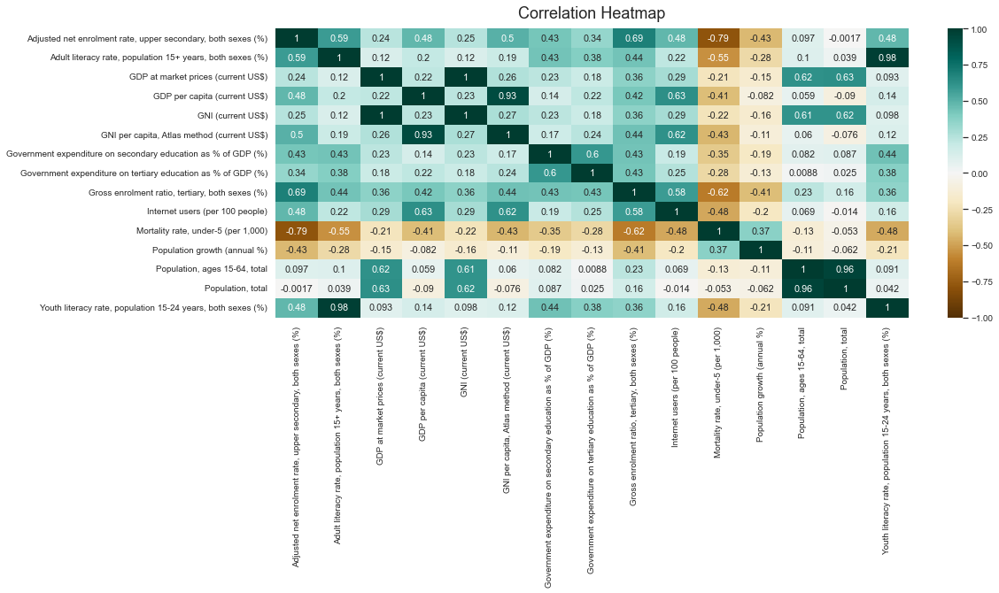

In [103]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(final_data.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
# save heatmap as .png file
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

Selon le résultat de la matrice de corrélation, nous avons certaines variables qui sont fortement corréler et nous devons donc en exclure quelques unes pour éviter d'avoir un biais et fausser nos résulats. Par exemple, Adjusted net enrolment rate, lower secondary, both sexes (%) et Adjusted net enrolment rate, upper secondary, both sexes (%) sont corrélés. Adult literacy rate, population 15+ years, both sexes (%) & Youth literacy rate, population 15-24 years, both sexes (%) sont corrélés.

In [104]:
final_data.columns

Index(['Country Name', 'Country Code', 'variable',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'Adult literacy rate, population 15+ years, both sexes (%)',
       'GDP at market prices (current US$)', 'GDP per capita (current US$)',
       'GNI (current US$)', 'GNI per capita, Atlas method (current US$)',
       'Government expenditure on secondary education as % of GDP (%)',
       'Government expenditure on tertiary education as % of GDP (%)',
       'Gross enrolment ratio, tertiary, both sexes (%)',
       'Internet users (per 100 people)',
       'Mortality rate, under-5 (per 1,000)', 'Population growth (annual %)',
       'Population, ages 15-64, total', 'Population, total',
       'Youth literacy rate, population 15-24 years, both sexes (%)', 'Region',
       'Income Group'],
      dtype='object')

In [308]:
liste_indicators =['Country Name', 'Country Code', 'variable',
       'Gross enrolment ratio, tertiary, both sexes (%)',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'GDP per capita (current US$)',
       'Government expenditure on secondary education as % of GDP (%)',
       'Government expenditure on tertiary education as % of GDP (%)', 
       'Population growth (annual %)',
       'Population, total','Internet users (per 100 people)','Youth literacy rate, population 15-24 years, both sexes (%)', 'Region',
       'Income Group']
                    
final_data2 = final_data[liste_indicators]
final_data2

,Country Name,Country Code,variable,"Gross enrolment ratio, tertiary, both sexes (%)","Adjusted net enrolment rate, upper secondary, both sexes (%)",GDP per capita (current US$),Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),Population growth (annual %),"Population, total",Internet users (per 100 people),"Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
27,Albania,ALB,1990,8.369110,82.310336,639.463899,1.787637,0.689884,1.799086,3286542.0,0.000000,98.904951,Europe & Central Asia,Upper middle income
28,Albania,ALB,1991,8.859930,82.310336,348.711318,1.787637,0.689884,-0.602810,3266790.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
29,Albania,ALB,1992,9.294170,82.310336,218.492166,1.787637,0.689884,-0.606435,3247039.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
30,Albania,ALB,1993,11.188740,82.310336,380.527371,1.787637,0.689884,-0.610166,3227287.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
31,Albania,ALB,1994,10.647750,82.310336,619.065163,1.787637,0.689884,-0.613881,3207536.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
32,Albania,ALB,1995,10.220340,82.310336,760.559376,1.787637,0.689884,-0.617704,3187784.0,0.011169,98.904951,Europe & Central Asia,Upper middle income
33,Albania,ALB,1996,10.963050,82.310336,1046.358511,1.787637,0.689884,-0.621511,3168033.0,0.032197,98.904951,Europe & Central Asia,Upper middle income
34,Albania,ALB,1997,12.733760,82.310336,749.584649,1.787637,0.689884,-0.625430,3148281.0,0.048594,98.904951,Europe & Central Asia,Upper middle income
35,Albania,ALB,1998,13.594760,82.310336,865.302162,1.787637,0.689884,-0.629334,3128530.0,0.065027,98.904951,Europe & Central Asia,Upper middle income
36,Albania,ALB,1999,14.805040,82.310336,1098.425463,1.787637,0.689884,-0.633352,3108778.0,0.081437,98.904951,Europe & Central Asia,Upper middle income


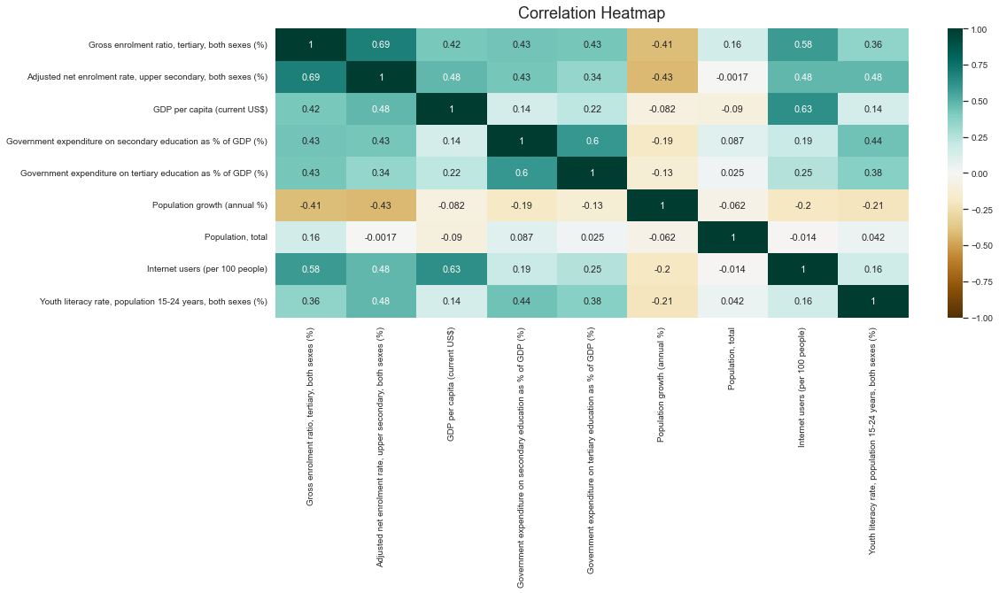

In [106]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(final_data2.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
# save heatmap as .png file
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

In [107]:
final_data_aggregated=final_data2.groupby(by=['Country Name']).mean().reset_index()#on le mets ici en colonne avec reset_index
final_data_aggregated

,Country Name,"Gross enrolment ratio, tertiary, both sexes (%)","Adjusted net enrolment rate, upper secondary, both sexes (%)",GDP per capita (current US$),Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),Population growth (annual %),"Population, total",Internet users (per 100 people),"Youth literacy rate, population 15-24 years, both sexes (%)"
0,Albania,26.504777,81.314661,2319.362411,1.747415,0.693068,-0.427443,3.050069e+06,21.926891,98.929734
1,Algeria,22.370073,55.528893,2989.212231,2.040325,1.172343,1.758471,3.278634e+07,10.452480,95.694983
2,American Samoa,0.000000,40.220821,7906.542303,0.000000,0.000000,0.734856,5.524967e+04,22.603762,0.000000
3,Andorra,46.862472,82.237899,30584.844385,1.191909,0.535731,1.435652,7.199156e+04,47.212516,99.801790
4,Argentina,55.158344,53.672862,8066.823292,1.664717,0.837663,1.136214,3.831344e+07,22.991547,97.657647
5,Armenia,35.285827,72.033748,1804.212673,2.162904,0.939930,-0.703323,3.072882e+06,15.180280,99.806020
6,Austria,54.183617,81.043214,35865.801365,2.363545,1.397986,0.511230,8.164154e+06,43.242725,99.555698
7,Azerbaijan,26.358371,80.021896,2766.231531,1.787637,0.464493,1.165371,8.370866e+06,24.384117,99.290583
8,"Bahamas, The",34.452493,67.512944,20500.628223,1.356113,1.240797,1.631374,3.207963e+05,31.533475,98.875865
9,Bahrain,25.555839,72.366761,15954.939028,2.183270,0.844849,4.022195,8.799730e+05,37.108689,97.260710


<AxesSubplot:xlabel='Country Name', ylabel='Internet users (per 100 people)'>

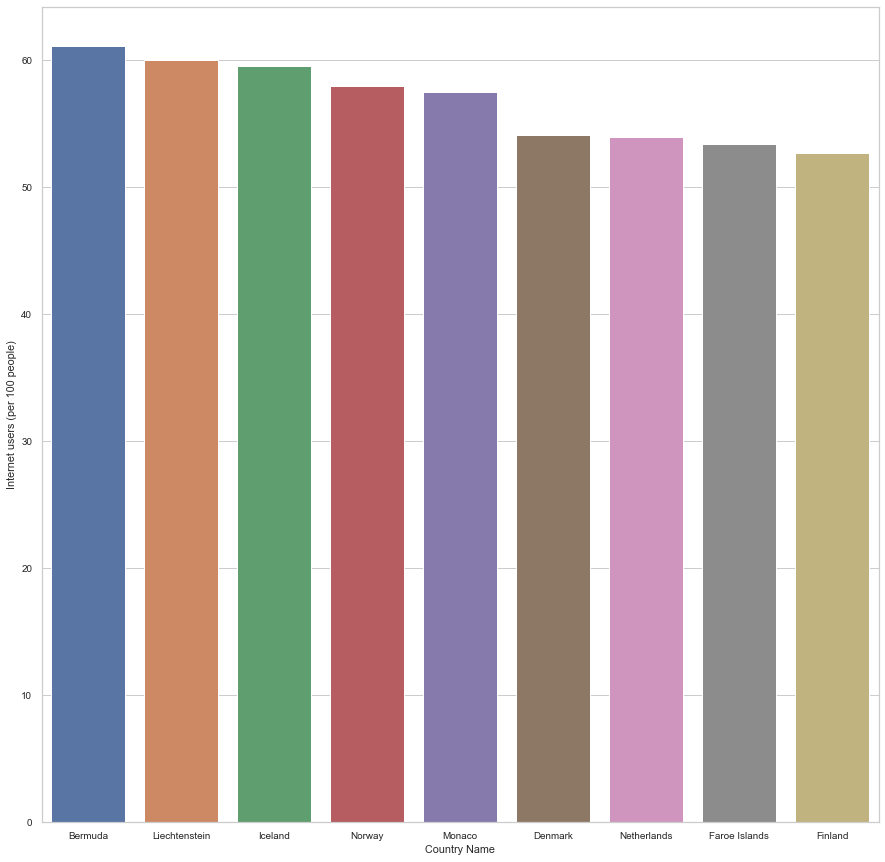

In [108]:
df_internet=final_data_aggregated[["Country Name", "Internet users (per 100 people)"]].sort_values('Internet users (per 100 people)', ascending=False).iloc[:9]
plt.figure(figsize=(15, 15))
sns.barplot(data=df_internet, x="Country Name", y="Internet users (per 100 people)")

### Ci-dessous nous avons simplement réajuster la taille de notre graphique 

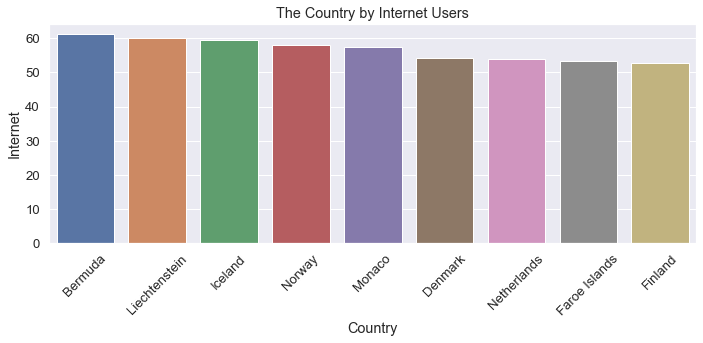

In [109]:
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_internet, x="Country Name", y="Internet users (per 100 people)").set(
                xlabel="Pays", ylabel="Utilisateurs d'internet", title = 'The Country by Internet Users')
plt.xticks(rotation=45)
plt.tight_layout()

### La distribution de chaque pays en fonction des utilisateurs d'internet 

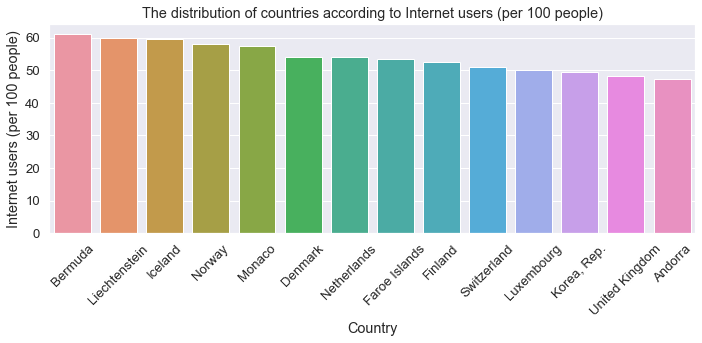

In [110]:
df_internet=final_data_aggregated[["Country Name", "Internet users (per 100 people)"]].sort_values('Internet users (per 100 people)', ascending=False).iloc[:14]
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_internet, x="Country Name", y="Internet users (per 100 people)").set(
                xlabel="Pays", ylabel="Utilisateurs d'internet (par 100 personnes)", title = 'La distribution d\'utilisateurs d\'internt en fonction des pays')
plt.xticks(rotation=45)
plt.tight_layout()

Ci dessous nous pouvons voir la qualité de la connexion internet dont dispose chaque pays et je me suis permise de retenir le 15 premiers pays. Plus de 50% des personnes utilisent internet sur 100. 

#### La distribution de chaque pays en fonction du Pib par habitant 

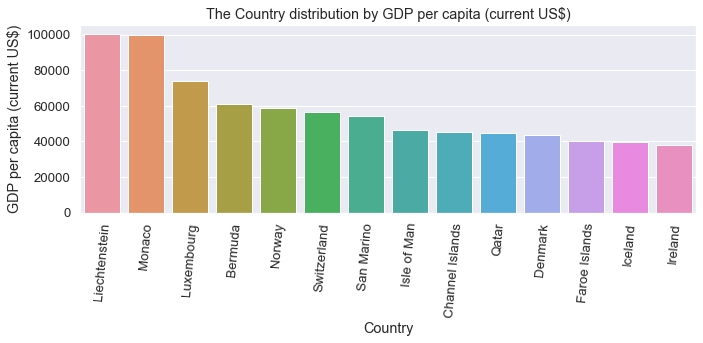

In [111]:
df_gdp=final_data_aggregated[["Country Name", "GDP per capita (current US$)"]].sort_values('GDP per capita (current US$)', ascending=False).iloc[:14]
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_gdp, x="Country Name", y="GDP per capita (current US$)").set(
                xlabel="Pays", ylabel="Pib par habitant", title ="Pib par habitant en fonction de chaque pays")
plt.xticks(rotation=85)
plt.tight_layout()

Nous pouvons voir ici que les pays qui ont le pib par habitant les plus élevés sont le Liechtenstein, Monaco, Luxembourg, Bermuda et Norvège. Se sont ces types des pays dans lesquels nous pourrons implanter la structure de formation en ligne puisque ses pays ont une richesse élevée et donc nous pourrons avoir beaucoup plus de chance d'avoir des clients. 

#### La distribution de chaque pays en fonction des dépenses éffectuées par le gouvernement pour les élèves du lycée

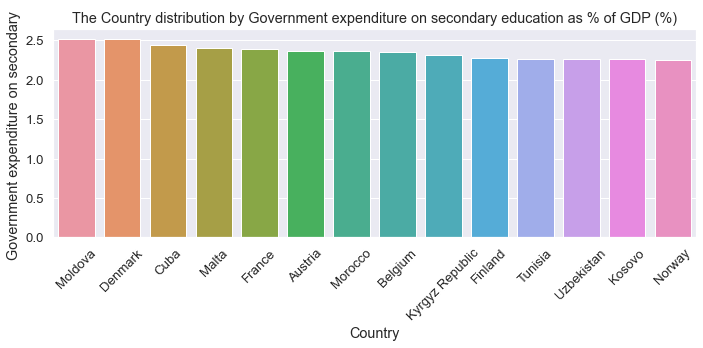

In [112]:
df_current_expend=final_data_aggregated[["Country Name", "Government expenditure on secondary education as % of GDP (%)"]].sort_values('Government expenditure on secondary education as % of GDP (%)', ascending=False).iloc[:14]
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_current_expend, x="Country Name", y="Government expenditure on secondary education as % of GDP (%)").set(
                xlabel="Pays", ylabel="Dépenses gourvenementaux pour le secondaire", title = 'Distribution des dépenses gouvernementaux en fonction de chaque pays')
plt.xticks(rotation=45)
plt.tight_layout()

'Country Name', 'Country Code', 'variable',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'Adult literacy rate, population 15+ years, both sexes (%)',
       'GDP at market prices (current US$)', 'GDP per capita (current US$)',
       'GNI (current US$)', 'GNI per capita, Atlas method (current US$)',
       'Government expenditure on secondary education as % of GDP (%)',
       'Government expenditure on tertiary education as % of GDP (%)',
       'Gross enrolment ratio, tertiary, both sexes (%)',
       'Internet users (per 100 people)',
       'Mortality rate, under-5 (per 1,000)', 'Population growth (annual %)',
       'Population, total',
       'Youth literacy rate, population 15-24 years, both sexes (%)', 'Region',
       'Income Group'],
 

#### Distribution du taux brut de scolarisation à l'université en fonction des pays

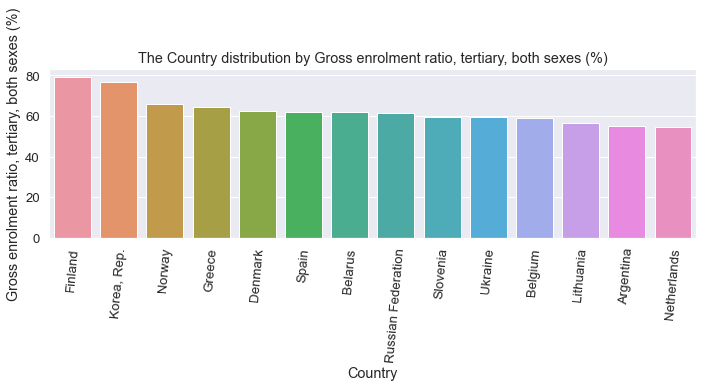

In [113]:
df_gross_enrolment=final_data_aggregated[["Country Name", "Gross enrolment ratio, tertiary, both sexes (%)"]].sort_values('Gross enrolment ratio, tertiary, both sexes (%)', ascending=False).iloc[:14]
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_gross_enrolment, x="Country Name", y="Gross enrolment ratio, tertiary, both sexes (%)").set(
                xlabel="Pays", ylabel="Taux brut de scolarisation, tertiaire, les deux sexes (%)", title = 'La distribution du taux de scolarisation, tertiaire, en fonction de chaque pays')
plt.xticks(rotation=85)
plt.tight_layout()

#### Distribution du taux de croissance de la population en fonction des pays

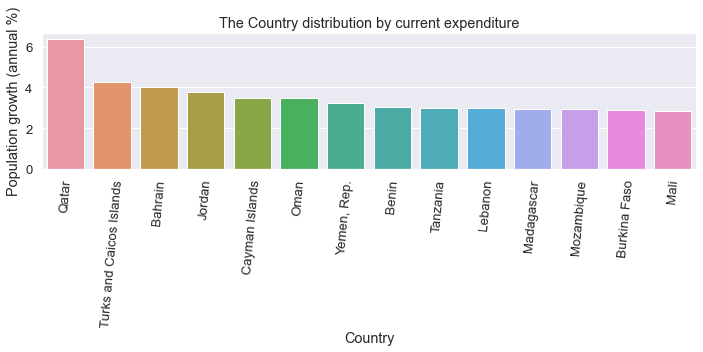

In [114]:
df_population_growth=final_data_aggregated[["Country Name", "Population growth (annual %)"]].sort_values('Population growth (annual %)', ascending=False).iloc[:14]

plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_population_growth, x="Country Name", y="Population growth (annual %)").set(
                xlabel="Pays", ylabel="Croissance de la population en (%)", title = 'Distribution de la croissance de la population en fonction de chaque pays')
plt.xticks(rotation=85)
plt.tight_layout()

#### Distribution de chaque pays en fonction des pays

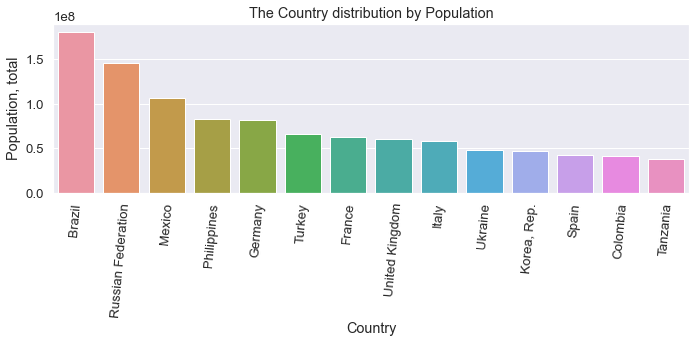

In [115]:
df_population=final_data_aggregated[["Country Name", "Population, total"]].sort_values('Population, total', ascending=False).iloc[:14]

plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_population, x="Country Name", y="Population, total").set(
                xlabel="Pays", ylabel="Population", title = 'Distribution de chaque pays en fonction de la population')
plt.xticks(rotation=85)
plt.tight_layout()

### SCORING & PONDERATION

In [116]:
final_data2

,Country Name,Country Code,variable,"Gross enrolment ratio, tertiary, both sexes (%)","Adjusted net enrolment rate, upper secondary, both sexes (%)",GDP per capita (current US$),Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),Population growth (annual %),"Population, total",Internet users (per 100 people),"Youth literacy rate, population 15-24 years, both sexes (%)",Region,Income Group
27,Albania,ALB,1990,8.369110,82.310336,639.463899,1.787637,0.689884,1.799086,3286542.0,0.000000,98.904951,Europe & Central Asia,Upper middle income
28,Albania,ALB,1991,8.859930,82.310336,348.711318,1.787637,0.689884,-0.602810,3266790.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
29,Albania,ALB,1992,9.294170,82.310336,218.492166,1.787637,0.689884,-0.606435,3247039.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
30,Albania,ALB,1993,11.188740,82.310336,380.527371,1.787637,0.689884,-0.610166,3227287.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
31,Albania,ALB,1994,10.647750,82.310336,619.065163,1.787637,0.689884,-0.613881,3207536.0,24.060761,98.904951,Europe & Central Asia,Upper middle income
32,Albania,ALB,1995,10.220340,82.310336,760.559376,1.787637,0.689884,-0.617704,3187784.0,0.011169,98.904951,Europe & Central Asia,Upper middle income
33,Albania,ALB,1996,10.963050,82.310336,1046.358511,1.787637,0.689884,-0.621511,3168033.0,0.032197,98.904951,Europe & Central Asia,Upper middle income
34,Albania,ALB,1997,12.733760,82.310336,749.584649,1.787637,0.689884,-0.625430,3148281.0,0.048594,98.904951,Europe & Central Asia,Upper middle income
35,Albania,ALB,1998,13.594760,82.310336,865.302162,1.787637,0.689884,-0.629334,3128530.0,0.065027,98.904951,Europe & Central Asia,Upper middle income
36,Albania,ALB,1999,14.805040,82.310336,1098.425463,1.787637,0.689884,-0.633352,3108778.0,0.081437,98.904951,Europe & Central Asia,Upper middle income


In [117]:
#final_data2["Adjusted net enrolment rate, lower secondary, both sexes (%)"]=0.0
#final_data2["Adjusted net enrolment rate, upper secondary, both sexes (%)"]=0.0
#final_data2["Current expenditure as % of total expenditure in public institutions (%)"].apply(lambda x:0.2*x)
#final_data2["GDP per capita (current US$)"].apply(lambda x: 0.2*x)
#final_data2["Government expenditure per primary student as % of GDP per capita (%)"].apply(lambda x:0.2*x)
#final_data2["Government expenditure per primary student as % of GDP per capita (%)"].apply(lambda x: 0.2*x)
#final_data2["Population growth (annual %)"].apply(lambda x:0.1*x)
#final_data2["Population, total"].apply(lambda x:0.05*x)
#final_data2["Internet users (per 100 people)"].apply(lambda x:0.2*x)
#final_data2["Youth literacy rate, population 15-24 years, both sexes (%)"].apply(lambda x:0.05*x)

In [118]:
final_data2.columns

Index(['Country Name', 'Country Code', 'variable',
       'Gross enrolment ratio, tertiary, both sexes (%)',
       'Adjusted net enrolment rate, upper secondary, both sexes (%)',
       'GDP per capita (current US$)',
       'Government expenditure on secondary education as % of GDP (%)',
       'Government expenditure on tertiary education as % of GDP (%)',
       'Population growth (annual %)', 'Population, total',
       'Internet users (per 100 people)',
       'Youth literacy rate, population 15-24 years, both sexes (%)', 'Region',
       'Income Group'],
      dtype='object')

### Pour la suite j'ai enlevé la population dans le calcul du score car cela faussée mes résultats puisque il y a un certains pays qui ont une population élevée, j'ai donc continuer avec les 8 autres variables. 

In [310]:
final_data2["scoreD"]=0.05*final_data2["Gross enrolment ratio, tertiary, both sexes (%)"] + 
0.05*final_data2["Adjusted net enrolment rate, upper secondary, both sexes (%)"] + 
0.15*final_data2["GDP per capita (current US$)"] + 
0.15*final_data2["Government expenditure on secondary education as % of GDP (%)"] + 
0.20*final_data2["Government expenditure on tertiary education as % of GDP (%)"] + 
0.10*final_data2["Population growth (annual %)"] + 
0.25*final_data2["Internet users (per 100 people)"] +
0.01*final_data2["Population, total"]+
0.04*final_data2["Youth literacy rate, population 15-24 years, both sexes (%)"]
 

C:\Users\dtulomba\AppData\Local\Temp/ipykernel_4916/3428288866.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [120]:
#final_data2

In [311]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler((0,100))

final_data2["scoreD_scale"]=scaler.fit_transform(np.array(final_data2["scoreD"]).reshape(-1, 1))

C:\Users\dtulomba\AppData\Local\Temp/ipykernel_4916/739746322.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [312]:
final_data_new_aggregated=final_data2.groupby(by=['Country Name']).mean().reset_index()
final_data_new_aggregated

,Country Name,"Gross enrolment ratio, tertiary, both sexes (%)","Adjusted net enrolment rate, upper secondary, both sexes (%)",GDP per capita (current US$),Government expenditure on secondary education as % of GDP (%),Government expenditure on tertiary education as % of GDP (%),Population growth (annual %),"Population, total",Internet users (per 100 people),"Youth literacy rate, population 15-24 years, both sexes (%)",scoreD,scoreD_scale
0,Albania,26.504777,81.314661,2319.362411,1.747415,0.693068,-0.427443,3.050069e+06,21.926891,98.929734,3.086378e+04,1.474032
1,Algeria,22.370073,55.528893,2989.212231,2.040325,1.172343,1.758471,3.278634e+07,10.452480,95.694983,3.283228e+05,15.791394
2,American Samoa,0.000000,40.220821,7906.542303,0.000000,0.000000,0.734856,5.524967e+04,22.603762,0.000000,1.746213e+03,0.072539
3,Andorra,46.862472,82.237899,30584.844385,1.191909,0.535731,1.435652,7.199156e+04,47.212516,99.801790,5.330322e+03,0.245050
4,Argentina,55.158344,53.672862,8066.823292,1.664717,0.837663,1.136214,3.831344e+07,22.991547,97.657647,3.843601e+05,18.488591
5,Armenia,35.285827,72.033748,1804.212673,2.162904,0.939930,-0.703323,3.072882e+06,15.180280,99.806020,3.101305e+04,1.481217
6,Austria,54.183617,81.043214,35865.801365,2.363545,1.397986,0.511230,8.164154e+06,43.242725,99.555698,8.704365e+04,4.178094
7,Azerbaijan,26.358371,80.021896,2766.231531,1.787637,0.464493,1.165371,8.370866e+06,24.384117,99.290583,8.413946e+04,4.038309
8,"Bahamas, The",34.452493,67.512944,20500.628223,1.356113,1.240797,1.631374,3.207963e+05,31.533475,98.875865,6.300608e+03,0.291752
9,Bahrain,25.555839,72.366761,15954.939028,2.183270,0.844849,4.022195,8.799730e+05,37.108689,97.260710,1.121193e+04,0.528145


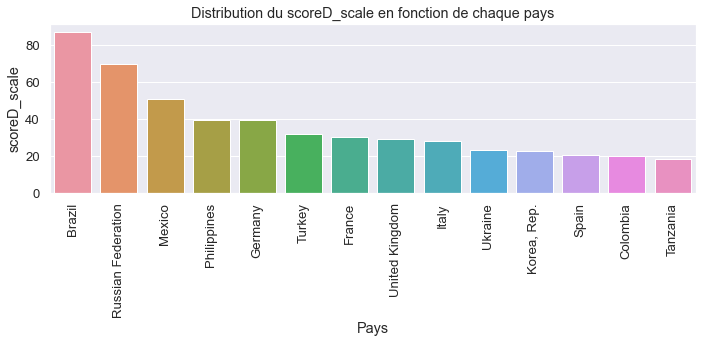

In [313]:
df_current_expend=final_data_new_aggregated[["Country Name", "scoreD_scale"]].sort_values('scoreD_scale', ascending=False).iloc[:14]
plt.figure(figsize=(10,5))
sns.set(font_scale=1.2)
sns.barplot(data=df_current_expend, x="Country Name", y="scoreD_scale").set(
                xlabel="Pays", ylabel="scoreD_scale", title = 'Distribution du scoreD_scale en fonction de chaque pays')
plt.xticks(rotation=90)
plt.tight_layout()

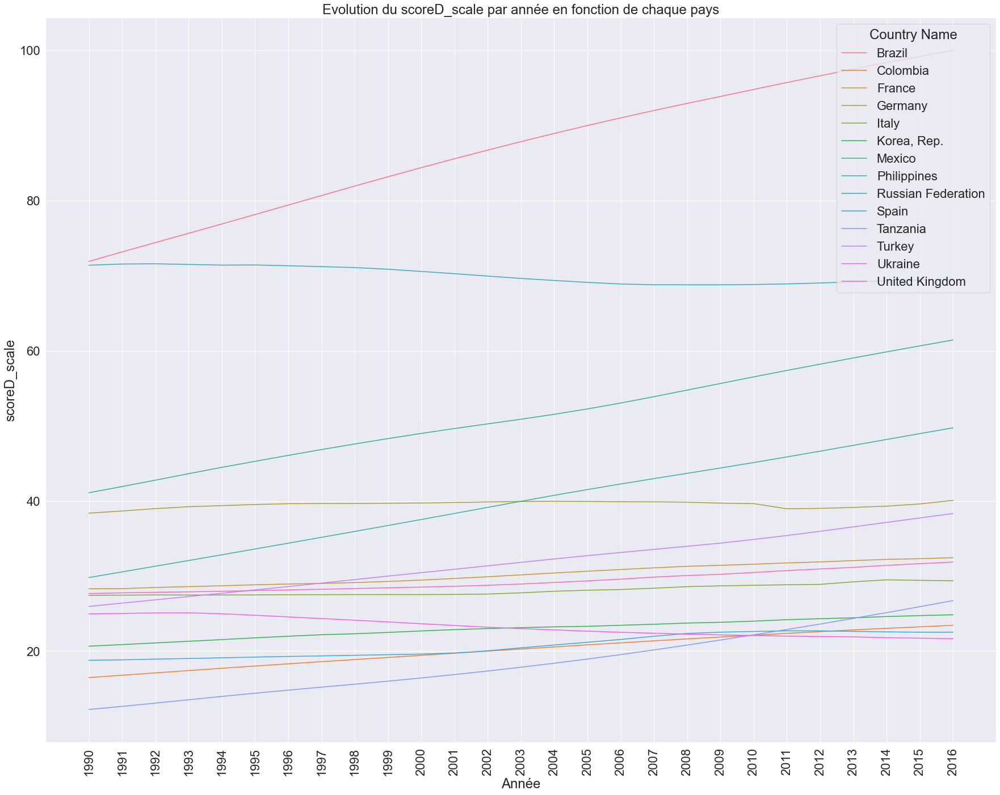

In [314]:
df_test=final_data2.loc[final_data2["Country Name"].isin(df_current_expend["Country Name"].unique())][["Country Name", "variable", "scoreD_scale"]]
plt.figure(figsize=(25,20))
sns.set(font_scale=2)
sns.lineplot(data=df_test, x="variable", y="scoreD_scale", hue="Country Name").set(
                xlabel="Année", ylabel="scoreD_scale", title = 'Evolution du scoreD_scale par année en fonction de chaque pays')
plt.xticks(rotation=90)
plt.tight_layout()

### Conclusion

Dans un premier temps, nous pouvons conclure que le dataset est pertinent pour répondre à la problématique car il possède de données riche et diversifiées  pour comparer les pays :

    La plupart des pays du monde sont présents dans le dataset 
    Nous connaissons la source des indicateurs et donc leur fiabilité 
    Les données sont diverfiées, le dataset comporte à la fois de données sur 
    
    - la démographique, le nivea, 
    - l'investissement dans l'éducation, 
    - la réussite scolaire,
    - l'investissement dans l'éducation,
    - le pib par habitant et le pib générale,
    
Dans un second temps, nous pouvons aussi dire que la majorité des pays dans lesquels l'entreprise peut s'implanter sont en majorité des pays occidentaux. 
    
Nous pouvons donc en conclure que ce jeu de données contient l'ensemble des éléments et d'informations dont on a besoin. 

Cependant :

- les indicateurs ont beaucoup des valeurs manquantes et cela rends l'analyse compliquée. 
- le jeu de données manque d'autres données qui pourraient être important comme par exemple l'argent dépensé sur internet, la proportion d'élèves se formant en dehors des établissements scolaires "classiques".


